# Zadanie domowe

W przypadku obrazów w odcieniach szarości pojedynczy piksel z zakresu [0; 255] reprezentowany jest jako 8-bitowa liczba bez znaku.
Pewnym rozszerzeniem analizy sposobu reprezentacji obrazu może być następujący eksperyment.
Załóżmy, że z każdego z 8 bitów możemy stworzyć pojedynczy obraz binarny (ang. _bit-plane slicing_).
Dla obrazka _100zloty.jpg_ (https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/100zloty.jpg) stwórz 8 obrazów, z których każdy powinien zawierać jedną płaszczyznę bitową.
Podpowiedź $-$ warto sprawdzić, jak realizuje się bitowe operacje logiczne.
Zastosowanie takiej dekompozycji obrazu pozwala na analizę ,,ważności'' poszczególnych bitów.
Jest to użyteczne w kwantyzacji, ale także w kompresji.

W drugim etapie zadania proszę spróbować odtworzyć obraz oryginalny z mniejszej liczby obrazów binarnych.
Warto zacząć od dwóch najbardziej znaczących bitów, a później dodawać kolejne.
Należy utworzyć co najmniej trzy wersje zrekonstruowanych obrazów.
Podpowiedź $-$ rekonstrukcja obrazu to mnożenie przez odpowiednią potęgę liczby 2 (przesunięcie bitowe) oraz dodawanie.

In [43]:
import cv2
import os
import requests
import matplotlib.pyplot as plt
import numpy as np

url = 'https://raw.githubusercontent.com/vision-agh/poc_sw/master/02_Point/'
fileName = '100zloty.jpg'
if not os.path.exists(fileName) :
    r = requests.get(url + fileName, allow_redirects=True)
    open(fileName, 'wb').write(r.content)

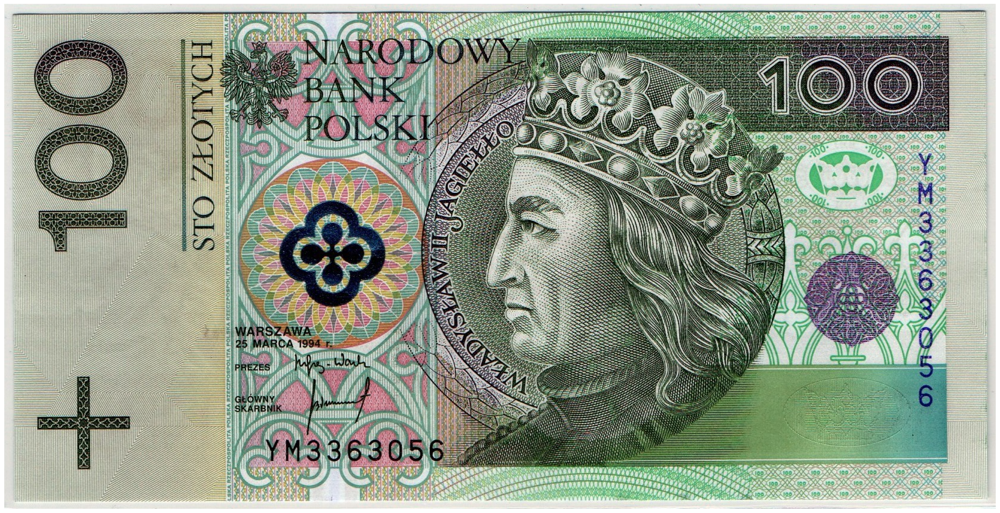

In [44]:
img_100_pln = cv2.imread(fileName)
plt.axis('off')
plt.imshow(img_100_pln)

<function matplotlib.pyplot.show(close=None, block=None)>

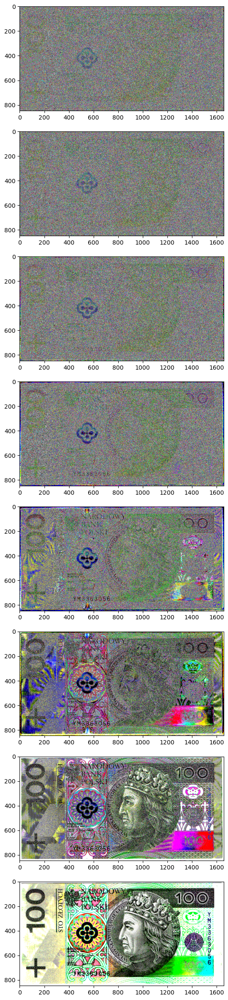

In [45]:
f, ax = plt.subplots(8, 1, figsize=(30, 30))
transformed_images = []

# 10101001
# AND
# 00000001 <<
# 00001000

# 00001000
# True
# 10000000

for i, axis in enumerate(ax):
    temp_img = (img_100_pln & (1 << i)) #checking if i-th bit is 0 or 1
    transformed_images.append(temp_img)
    temp_img = temp_img.astype('bool').astype('uint8') * 255
    axis.imshow(temp_img, cmap='gray')
plt.show

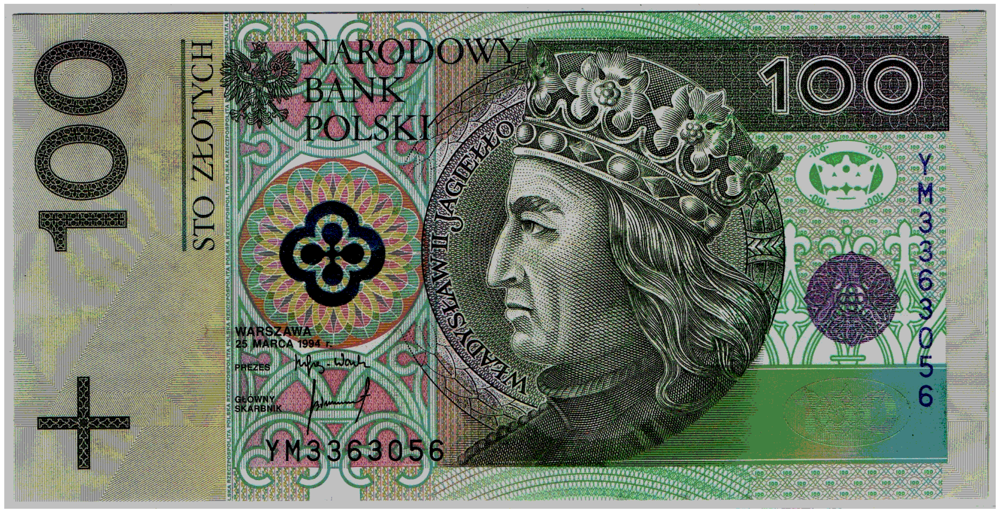

In [46]:
img1 = transformed_images[-1] + transformed_images[-2]

plt.axis('off')
plt.imshow(img1)